In [2]:
import pathlib
import cv2
import numpy as np

from tqdm import tqdm

from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from skimage import data, img_as_float
from skimage.measure import compare_ssim as ssim

def calculate_t_ssim(file_path, scaling):
    img_arr = None
    prev_img = None
    for current_file in tqdm(sorted(pathlib.Path(file_path).iterdir())):
    #for current_file in sorted(pathlib.Path(file_path).iterdir()):
        file_string = str(current_file)
        img = cv2.imread(file_string, flags=cv2.IMREAD_GRAYSCALE)
            
        curr_img = cv2.resize(img, None,
                     fx=scaling, fy=scaling, 
                     interpolation=cv2.INTER_AREA)

        if img_arr is None:
            img_arr = np.zeros((1, 0))
            prev_img = curr_img
            continue
        
        ssim_measure = ssim(prev_img, curr_img)
        img_arr = np.append(img_arr, ssim_measure, axis=1)

    print (img_arr)
    avg = np.mean(img_norms)
    transition_frames = np.argwhere(img_norms > avg).flatten()

    return transition_frames

def calculate_t_frames(file_path, scaling=None):
    img_arr = None
    #for current_file in tqdm(sorted(pathlib.Path(file_path).iterdir())):
    for current_file in sorted(pathlib.Path(file_path).iterdir()):
        file_string = str(current_file)
        img = cv2.imread(file_string, flags=cv2.IMREAD_GRAYSCALE)
            
        if scaling is not None:
            img = cv2.resize(img, None,
                             fx=scaling, fy=scaling, 
                             interpolation=cv2.INTER_AREA)
        if img_arr is None:
            height, width = np.shape(img)[:2]
            flat_d = height * width
            img_arr = np.zeros((flat_d,0))
            
            # Show scaled image for exploring
            fig = plt.figure()
            fig.add_subplot(1,1,1)
            img = img_as_float(img)
            plt.imshow(img, cmap=plt.cm.gray, vmin=0, vmax=1)
            plt.show()
                    
        img_1d = np.expand_dims(np.ravel(img), axis=1)
        img_arr = np.append(img_arr, img_1d, axis=1)

    img_diff = np.diff(img_arr)
    img_norms = np.linalg.norm(img_diff, axis=0)
    
    avg = np.mean(img_norms)
    std = np.std(img_norms)
    transition_frames = np.argwhere(img_norms > avg).flatten()
    transition_values = img_norms[img_norms > avg]
    transition_frames_std = np.argwhere(img_norms > avg+std).flatten()
    transition_values_std = img_norms[img_norms > avg+std]

    return (transition_frames, transition_values, 
            avg, std,
            transition_frames_std, transition_values_std)

def get_files_list(file_path, transition_frames):
    files_list = list()
    first_file = sorted(pathlib.Path(file_path).iterdir())[0]
    start_int = int(first_file.stem)
    #for i in tqdm(transition_frames):
    for i in transition_frames:
        files_list.append(str(pathlib.Path(file_path)
                      .joinpath('{:03d}.jpg'.format(i+start_int))))
    return files_list

def display_images(files_list):
    fig = plt.figure(1, (14., 10.))
    img_per_row = 7
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(len(files_list)//img_per_row+1, img_per_row),  # creates 2x2 grid of axes
                 axes_pad=0.05,  # pad between axes in inch.
                 )
    #for i,f in tqdm(enumerate(files_list)):
    for i,f in enumerate(files_list):
        img = cv2.imread(f)
        img = img_as_float(img)
        grid[i].axis('off')
        grid[i].imshow(img, cmap=plt.cm.gray, vmin=0, vmax=1)
    return grid

In [4]:
def run(file_path):
    scaling_options = [0.001, 0.002, 0.005, 0.01, 0.1]
    for scaling in scaling_options:
        print("scale: {}".format(scaling))
        (transition_frames, transition_values, 
         avg, std,
         transition_frames_std, transition_values_std) = calculate_t_frames(file_path, scaling)
        files_list = get_files_list(file_path, transition_frames)
        display_images(files_list)
        plt.show()
        
        print("Count: {}\nList: {}\nAvg: {} Std: {}\nValues: {}".format(len(transition_frames), 
                                                                        transition_frames, 
                                                                        avg, std, 
                                                                        transition_values))
        files_list = get_files_list(file_path, transition_frames_std)
        display_images(files_list)
        plt.show()
        print("Count: {}\nList: {}\nAvg: {} Std: {}\nValues: {}".format(len(transition_frames_std), 
                                                                        transition_frames_std, 
                                                                        avg, std, 
                                                                        transition_values))

scale: 0.001


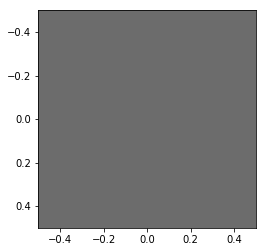

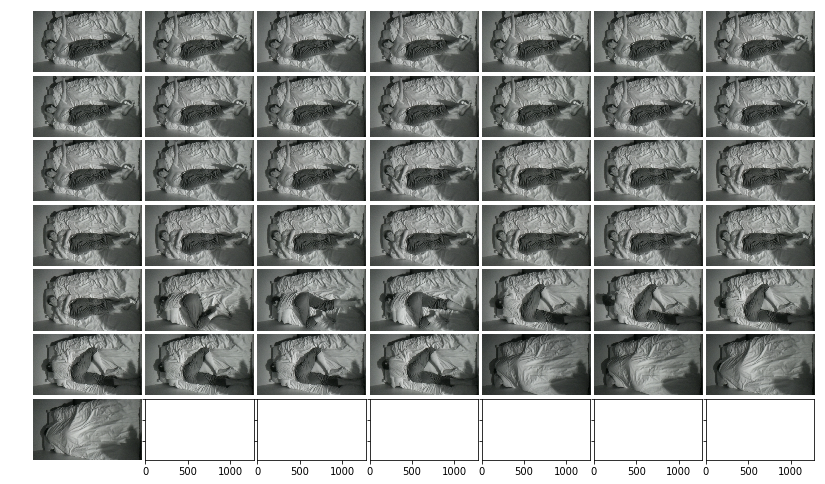

Count: 43
List: [  0   1   2   5   6  27  29  32  33  34  35  38  39  49  50  51  52  60
  61  62  63  64  67  72  73  74  75  82  83 182 183 184 185 186 208 210
 211 219 220 221 222 223 224]
Avg: 0.7714509803921568 Std: 7.337301098774092
Values: [109.57647059   1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           3.
   2.           2.           1.           1.           1.
   1.           1.           1.          12.           2.
   6.           2.           1.        ]


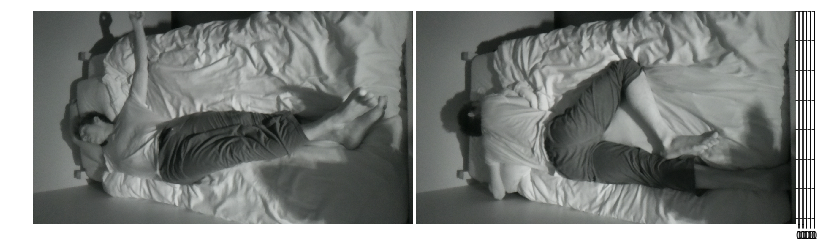

Count: 2
List: [  0 220]
Avg: 0.7714509803921568 Std: 7.337301098774092
Values: [109.57647059   1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           3.
   2.           2.           1.           1.           1.
   1.           1.           1.          12.           2.
   6.           2.           1.        ]
scale: 0.002


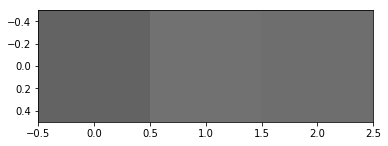

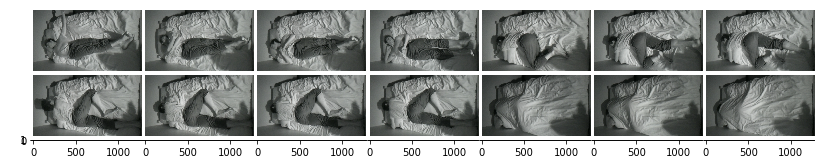

Count: 14
List: [  0  57 119 120 182 183 184 186 208 219 220 221 222 223]
Avg: 1.757240751854702 Std: 13.137802883477406
Values: [191.24381277   2.23606798   7.81024968  17.91647287  15.65247584
   7.34846923   3.           4.24264069   2.23606798   2.
  44.64302857   3.          11.           4.69041576]


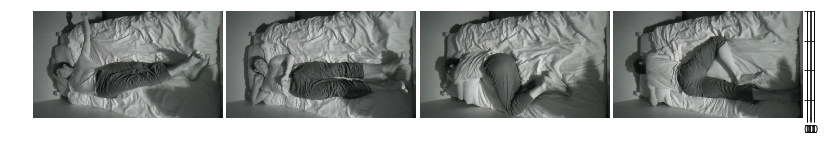

Count: 4
List: [  0 120 182 220]
Avg: 1.757240751854702 Std: 13.137802883477406
Values: [191.24381277   2.23606798   7.81024968  17.91647287  15.65247584
   7.34846923   3.           4.24264069   2.23606798   2.
  44.64302857   3.          11.           4.69041576]
scale: 0.005


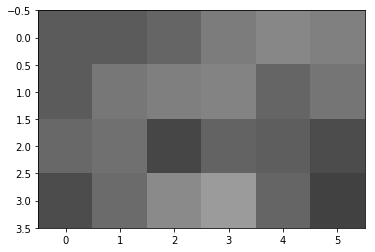

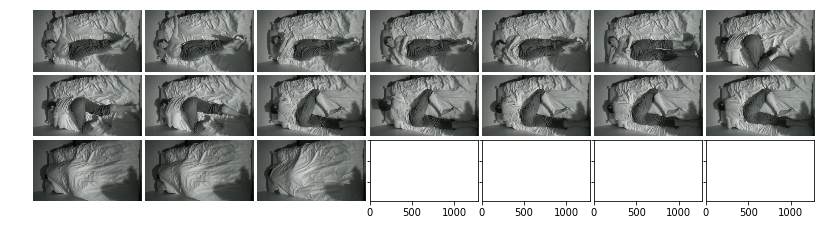

Count: 17
List: [  0  56  57  83 119 120 182 183 184 185 186 208 219 220 221 222 223]
Avg: 6.780806484929234 Std: 38.88574972745474
Values: [545.37894661  24.10394159  19.          10.86278049  39.57271787
 108.85311204  51.33225107  22.06807649  54.91812087  24.16609195
  26.07680962  19.02629759  14.73091986 165.22711642   9.38083152
  49.689033    13.07669683]


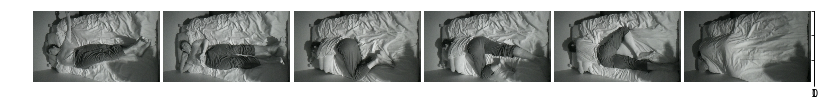

Count: 6
List: [  0 120 182 184 220 222]
Avg: 6.780806484929234 Std: 38.88574972745474
Values: [545.37894661  24.10394159  19.          10.86278049  39.57271787
 108.85311204  51.33225107  22.06807649  54.91812087  24.16609195
  26.07680962  19.02629759  14.73091986 165.22711642   9.38083152
  49.689033    13.07669683]
scale: 0.01


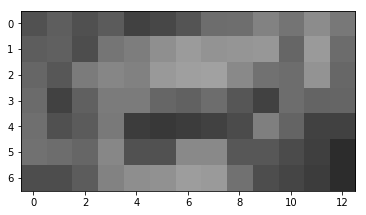

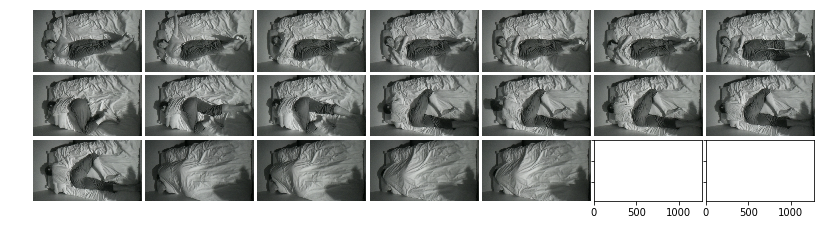

Count: 19
List: [  0  56  57  60  83 119 120 182 183 184 185 186 208 219 220 221 222 223
 224]
Avg: 15.775394047009657 Std: 79.40326951746384
Values: [1063.3287404    81.49233093   72.90404653   18.84144368   35.94440151
  125.73782247  252.1586802   151.61134522   59.91660872  219.51993076
   62.3778807    70.21395873   47.83304297   45.15528762  384.47886808
   19.02629759  106.89714683   25.51470164   17.4642492 ]


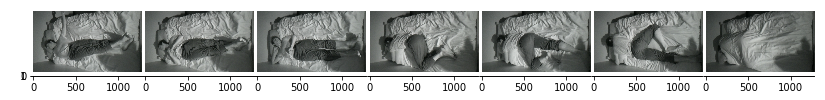

Count: 7
List: [  0 119 120 182 184 220 222]
Avg: 15.775394047009657 Std: 79.40326951746384
Values: [1063.3287404    81.49233093   72.90404653   18.84144368   35.94440151
  125.73782247  252.1586802   151.61134522   59.91660872  219.51993076
   62.3778807    70.21395873   47.83304297   45.15528762  384.47886808
   19.02629759  106.89714683   25.51470164   17.4642492 ]
scale: 0.1


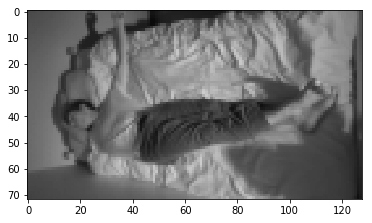

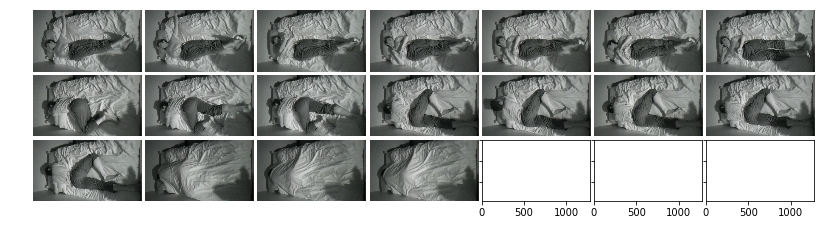

Count: 18
List: [  0  56  57  60  83 119 120 182 183 184 185 186 208 219 220 222 223 224]
Avg: 251.46449685777324 Std: 908.3994972686361
Values: [10991.34268227  1804.66839059  1338.50289503   798.13845917
  1294.85867955  2269.31950152  3733.68263247  2591.21998294
  1412.48256626  3378.58831467  1047.33375769  1309.6369726
  1206.71744829  1163.65072079  4760.24946825  1676.1569139
   265.99436084   411.61268202]


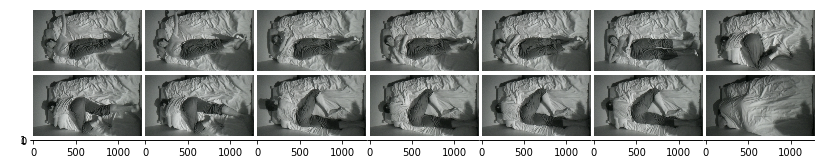

Count: 14
List: [  0  56  57  83 119 120 182 183 184 186 208 219 220 222]
Avg: 251.46449685777324 Std: 908.3994972686361
Values: [10991.34268227  1804.66839059  1338.50289503   798.13845917
  1294.85867955  2269.31950152  3733.68263247  2591.21998294
  1412.48256626  3378.58831467  1047.33375769  1309.6369726
  1206.71744829  1163.65072079  4760.24946825  1676.1569139
   265.99436084   411.61268202]


In [5]:
run('./test_data/2019-02-20-test/')

#Results above show improved performance, i.e. less similar images, with use of avg+std.

Results below show the need to clean up beginning and end of photos folder. 

scale: 0.001


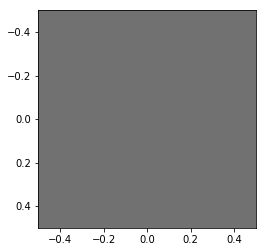

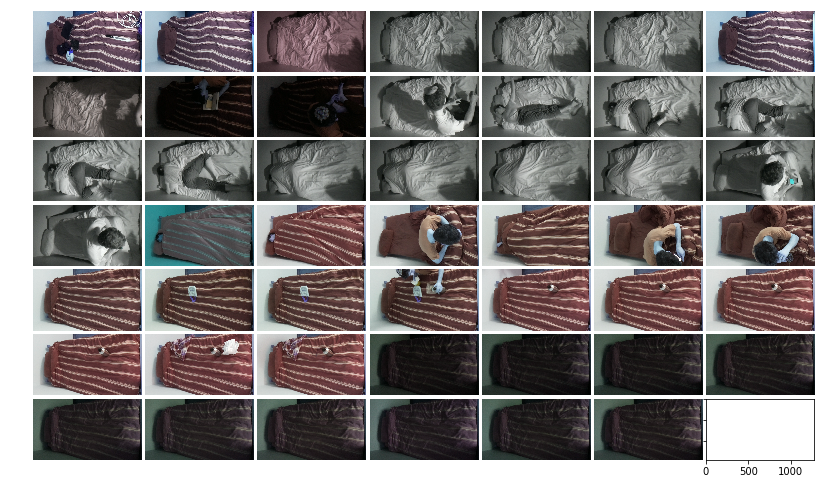

Count: 48
List: [  0  14  15  16  17  29  30  31  32  34  35  36 218 219 220 256 257 258
 259 261 262 263 264 265 281 284 285 286 287 288 318 319 320 322 323 324
 331 332 334 336 337 338 339 340 343 346 353 357]
Avg: 1.9374842973401059 Std: 9.553021201230038
Values: [112.55686275  27.          13.           5.           6.
   4.          38.          57.           3.          86.
   6.           2.           3.           2.           2.
  12.           2.           6.           2.          25.
  12.           7.          22.           3.           3.
   5.           3.           8.           7.           5.
   9.          10.           2.           2.           5.
   3.           3.          79.           4.           2.
   4.           4.           4.           3.           2.
   2.           2.           2.        ]


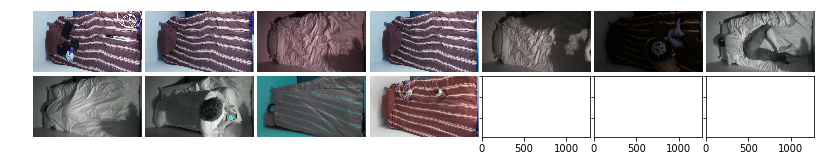

Count: 48
List: [  0  14  15  16  17  29  30  31  32  34  35  36 218 219 220 256 257 258
 259 261 262 263 264 265 281 284 285 286 287 288 318 319 320 322 323 324
 331 332 334 336 337 338 339 340 343 346 353 357]
Avg: 1.9374842973401059 Std: 9.553021201230038
Values: [112.55686275  27.          13.           5.           6.
   4.          38.          57.           3.          86.
   6.           2.           3.           2.           2.
  12.           2.           6.           2.          25.
  12.           7.          22.           3.           3.
   5.           3.           8.           7.           5.
   9.          10.           2.           2.           5.
   3.           3.          79.           4.           2.
   4.           4.           4.           3.           2.
   2.           2.           2.        ]
scale: 0.002


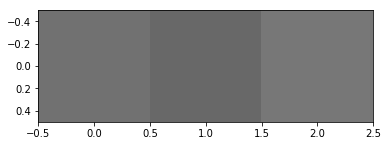

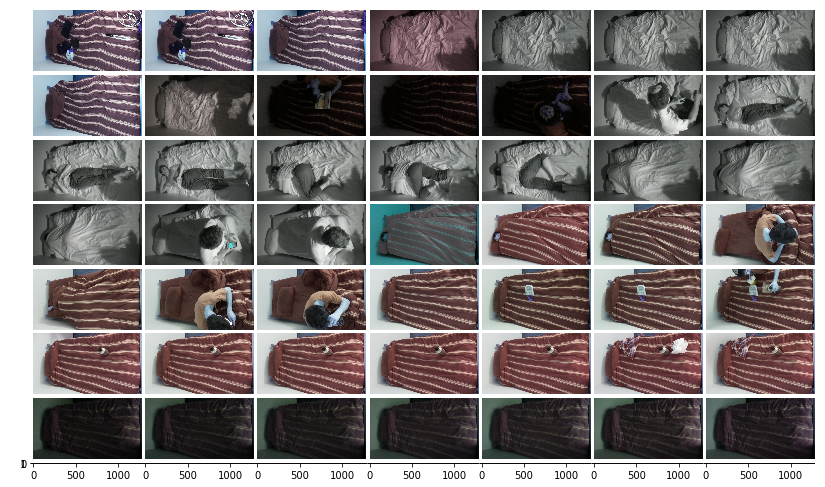

Count: 49
List: [  0   4  14  15  16  17  29  30  31  32  33  34  35  36 155 156 218 219
 256 258 259 261 262 263 264 265 279 281 284 285 286 287 288 318 319 320
 322 323 324 330 331 332 334 337 338 339 340 344 346]
Avg: 4.255870394821032 Std: 16.52982390688273
Values: [194.10243822   7.87400787  56.9912274   22.64950331   9.8488578
   9.2736185   38.8458492   89.62700486  80.92589202  10.
   5.         131.76114754  28.14249456   6.164414     7.81024968
  17.91647287  15.65247584   7.34846923  44.64302857  11.
   4.69041576  51.48786265  17.72004515  41.50903516  43.
   7.14142843   8.24621125  12.08304597  11.35781669   9.21954446
  12.04159458  28.17800561  25.88435821  14.17744688  17.72004515
   5.           5.74456265  11.53256259   5.83095189  17.23368794
  12.56980509 123.13813382   7.81024968   6.40312424   8.77496439
   8.1240384    6.164414     4.58257569   4.89897949]


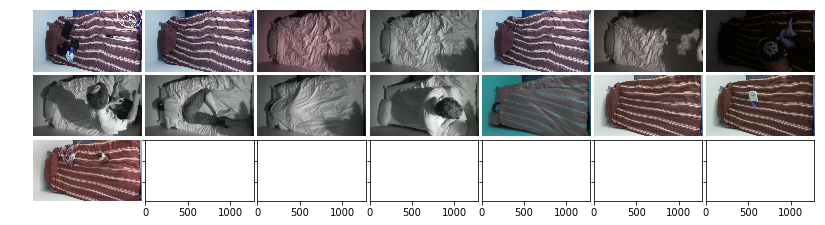

Count: 49
List: [  0   4  14  15  16  17  29  30  31  32  33  34  35  36 155 156 218 219
 256 258 259 261 262 263 264 265 279 281 284 285 286 287 288 318 319 320
 322 323 324 330 331 332 334 337 338 339 340 344 346]
Avg: 4.255870394821032 Std: 16.52982390688273
Values: [194.10243822   7.87400787  56.9912274   22.64950331   9.8488578
   9.2736185   38.8458492   89.62700486  80.92589202  10.
   5.         131.76114754  28.14249456   6.164414     7.81024968
  17.91647287  15.65247584   7.34846923  44.64302857  11.
   4.69041576  51.48786265  17.72004515  41.50903516  43.
   7.14142843   8.24621125  12.08304597  11.35781669   9.21954446
  12.04159458  28.17800561  25.88435821  14.17744688  17.72004515
   5.           5.74456265  11.53256259   5.83095189  17.23368794
  12.56980509 123.13813382   7.81024968   6.40312424   8.77496439
   8.1240384    6.164414     4.58257569   4.89897949]
scale: 0.005


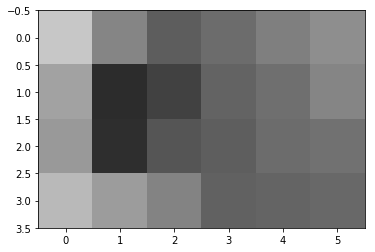

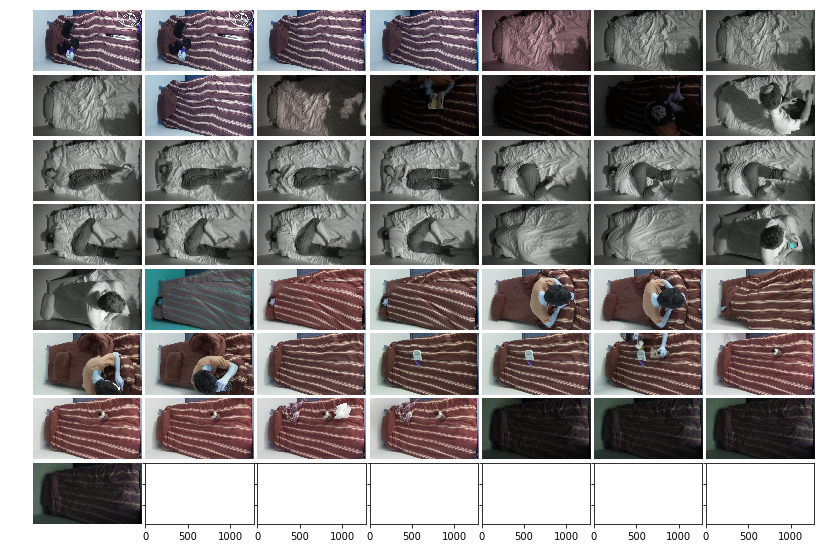

Count: 50
List: [  0   4  13  14  15  16  17  29  30  31  32  33  34  35  92  93 155 156
 218 219 220 221 222 244 256 258 261 262 263 264 265 279 280 281 284 285
 286 287 288 318 319 320 323 330 331 332 334 337 338 339]
Avg: 17.274118510242012 Std: 60.09141241178831
Values: [595.97140261  35.53871129  19.13112647 294.11392351  63.5767253
  27.89265136  27.34958866 270.22768178 338.37700868 306.27928431
  33.04542328  27.54995463 457.37402637 168.2557577   24.10394159
  19.          39.57271787 108.85311204  51.33225107  22.06807649
  54.91812087  24.16609195  26.07680962  19.02629759 165.22711642
  49.689033   246.46095025  98.80789442 183.90486671 172.68468374
  21.09502311  77.56932383  23.2594067   86.20904825 119.31051923
 103.72559954 114.19281939  64.23394741  50.30904491  65.10760324
  67.76429738  24.37211521  27.38612788  53.91660227  55.94640292
 408.47398938  20.4450483   18.02775638  23.17326045  18.60107524]


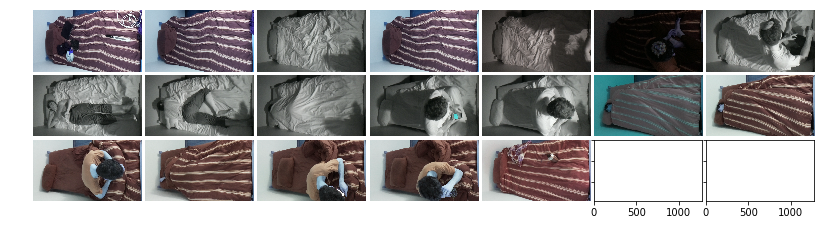

Count: 50
List: [  0   4  13  14  15  16  17  29  30  31  32  33  34  35  92  93 155 156
 218 219 220 221 222 244 256 258 261 262 263 264 265 279 280 281 284 285
 286 287 288 318 319 320 323 330 331 332 334 337 338 339]
Avg: 17.274118510242012 Std: 60.09141241178831
Values: [595.97140261  35.53871129  19.13112647 294.11392351  63.5767253
  27.89265136  27.34958866 270.22768178 338.37700868 306.27928431
  33.04542328  27.54995463 457.37402637 168.2557577   24.10394159
  19.          39.57271787 108.85311204  51.33225107  22.06807649
  54.91812087  24.16609195  26.07680962  19.02629759 165.22711642
  49.689033   246.46095025  98.80789442 183.90486671 172.68468374
  21.09502311  77.56932383  23.2594067   86.20904825 119.31051923
 103.72559954 114.19281939  64.23394741  50.30904491  65.10760324
  67.76429738  24.37211521  27.38612788  53.91660227  55.94640292
 408.47398938  20.4450483   18.02775638  23.17326045  18.60107524]
scale: 0.01


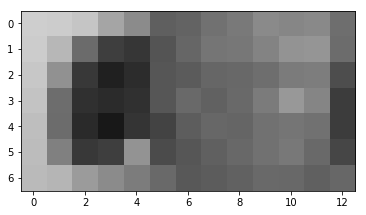

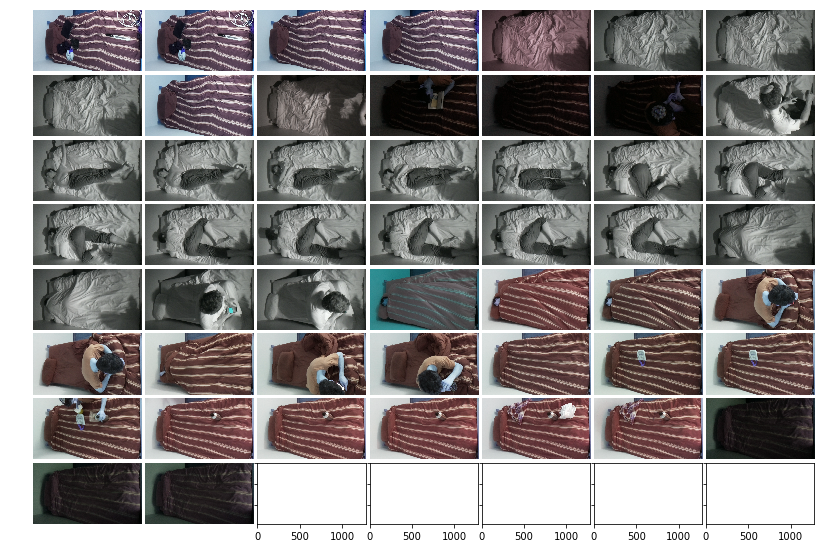

Count: 51
List: [  0   4  13  14  15  16  17  29  30  31  32  33  34  35  36  92  93 155
 156 218 219 220 221 222 244 255 256 258 261 262 263 264 265 279 280 281
 284 285 286 287 288 318 319 320 323 330 331 332 334 338 339]
Avg: 38.42915604095723 Std: 121.5900203987939
Values: [1131.32443665  149.           56.86826883  575.55799013  122.87798826
   53.25410782   53.53503526  560.52564616  685.55379074  605.93151428
   85.18215776   67.6535291   883.22873595  421.55545305   45.22167622
   81.49233093   72.90404653  125.73782247  252.1586802   151.61134522
   59.91660872  219.51993076   62.3778807    70.21395873   47.83304297
   45.15528762  384.47886808  106.89714683  538.30195987  238.117618
  407.49233122  338.26321112   40.13726448  205.63316853   62.46599075
  222.44549894  265.31302267  251.54919996  286.33721379  172.29625649
  130.33418585  182.4308088   180.07498438   67.13419397   59.07622195
  186.17464919  183.50749304  750.87682079   42.67317659   46.292548
   40.18706259]


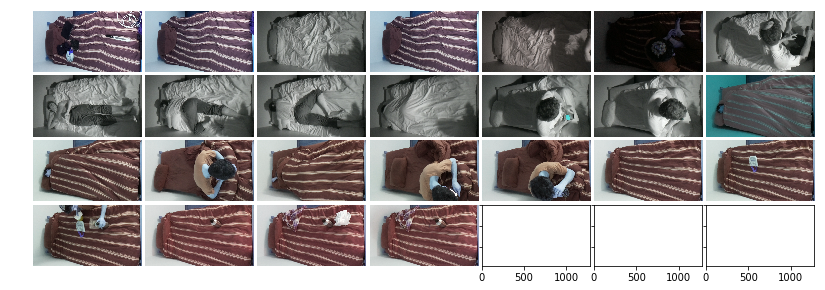

Count: 51
List: [  0   4  13  14  15  16  17  29  30  31  32  33  34  35  36  92  93 155
 156 218 219 220 221 222 244 255 256 258 261 262 263 264 265 279 280 281
 284 285 286 287 288 318 319 320 323 330 331 332 334 338 339]
Avg: 38.42915604095723 Std: 121.5900203987939
Values: [1131.32443665  149.           56.86826883  575.55799013  122.87798826
   53.25410782   53.53503526  560.52564616  685.55379074  605.93151428
   85.18215776   67.6535291   883.22873595  421.55545305   45.22167622
   81.49233093   72.90404653  125.73782247  252.1586802   151.61134522
   59.91660872  219.51993076   62.3778807    70.21395873   47.83304297
   45.15528762  384.47886808  106.89714683  538.30195987  238.117618
  407.49233122  338.26321112   40.13726448  205.63316853   62.46599075
  222.44549894  265.31302267  251.54919996  286.33721379  172.29625649
  130.33418585  182.4308088   180.07498438   67.13419397   59.07622195
  186.17464919  183.50749304  750.87682079   42.67317659   46.292548
   40.18706259]


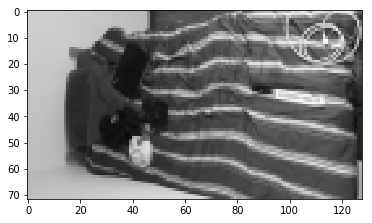

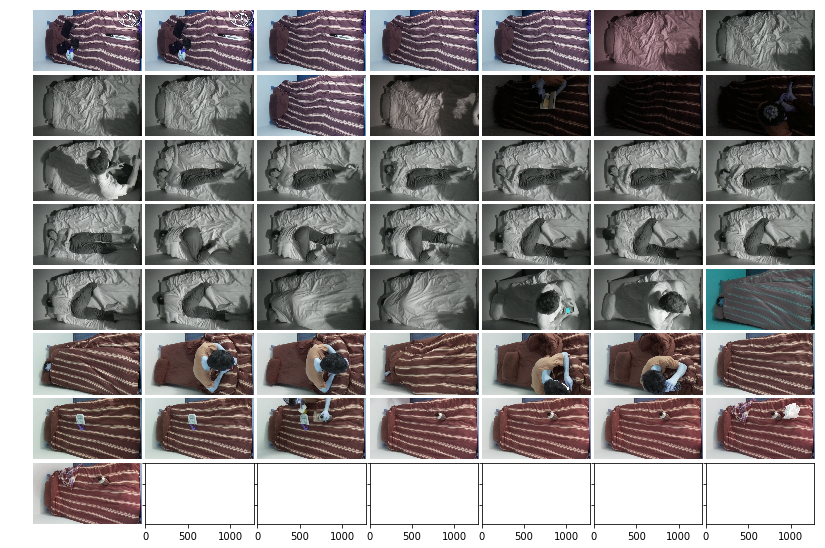

Count: 50
List: [  0   4   5  13  14  15  16  17  29  30  31  32  33  34  35  36  92  93
  96 119 155 156 218 219 220 221 222 244 255 256 258 261 262 263 264 279
 280 281 284 285 286 287 288 318 319 320 323 330 331 332]
Avg: 530.5640453632869 Std: 1461.4788559569856
Values: [12194.04831458  2446.18355812   859.98720921   697.80154772
  7225.31341881  1250.4327251    543.68005297   542.27207193
  7202.9884076   8203.82075621  6399.60912869  1154.64973044
  1253.9744814   9397.86066081  5416.95218735  1019.23353556
  1804.66839059  1338.50289503   798.13845917  1294.85867955
  2269.31950152  3733.68263247  2591.21998294  1412.48256626
  3378.58831467  1047.33375769  1309.6369726   1206.71744829
  1163.65072079  4760.24946825  1676.1569139   6069.67503249
  3371.87470111  5103.88812573  4054.2464158   4232.36021624
  1883.3748963   4310.48918338  4559.63934977  3683.23852065
  5113.77590436  1883.04832652  1346.36362102  2982.23992999
  2750.2067195   1087.51321831   606.31262563  2589.15

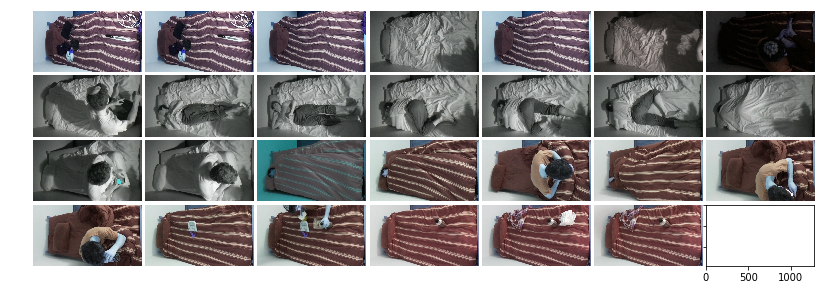

Count: 50
List: [  0   4   5  13  14  15  16  17  29  30  31  32  33  34  35  36  92  93
  96 119 155 156 218 219 220 221 222 244 255 256 258 261 262 263 264 279
 280 281 284 285 286 287 288 318 319 320 323 330 331 332]
Avg: 530.5640453632869 Std: 1461.4788559569856
Values: [12194.04831458  2446.18355812   859.98720921   697.80154772
  7225.31341881  1250.4327251    543.68005297   542.27207193
  7202.9884076   8203.82075621  6399.60912869  1154.64973044
  1253.9744814   9397.86066081  5416.95218735  1019.23353556
  1804.66839059  1338.50289503   798.13845917  1294.85867955
  2269.31950152  3733.68263247  2591.21998294  1412.48256626
  3378.58831467  1047.33375769  1309.6369726   1206.71744829
  1163.65072079  4760.24946825  1676.1569139   6069.67503249
  3371.87470111  5103.88812573  4054.2464158   4232.36021624
  1883.3748963   4310.48918338  4559.63934977  3683.23852065
  5113.77590436  1883.04832652  1346.36362102  2982.23992999
  2750.2067195   1087.51321831   606.31262563  2589.15

In [173]:
run('./test_data/2019-02-20/')

Looks like can capture transition frames even with extreme scaling. Gain in time.

Looks like color is still an issue even with rescaling.

In [141]:
def calculate_t_ssim(file_path, scaling):
    img_arr = None
    prev_img = None
    for current_file in sorted(pathlib.Path(file_path).iterdir()):
        file_string = str(current_file)
        img = cv2.imread(file_string, flags=cv2.IMREAD_GRAYSCALE)
            
        curr_img = cv2.resize(img, None,
                     fx=scaling, fy=scaling, 
                     interpolation=cv2.INTER_AREA)

        if img_arr is None:
            img_arr = list()
            prev_img = curr_img
            continue
        
        ssim_measure = ssim(prev_img, curr_img)
        img_arr.append(ssim_measure)
        
        prev_img = curr_img

    img_arr = np.array(img_arr)
    avg = np.mean(img_arr)
    transition_frames = np.argwhere(img_arr < avg).flatten()

    return transition_frames

In [142]:
calculate_t_ssim('./test_data/2019-02-20-test/', 0.1)

array([  0,  56,  57,  60,  83, 119, 120, 182, 183, 184, 185, 186, 208,
       219, 220, 222, 224])